In [1]:
%reload_ext autoreload
%autoreload 2

import socket
import os
if socket.gethostname().startswith('ax'):
    path_prefix = '/mnt/smb/locker/miller-locker/users/Tahereh'
    path_codes = '/mnt/smb/locker/miller-locker/users/Tahereh/Codes/Perceptually_Aligned_Gradients/'
    os.chdir(path_codes)
    import sys
    sys.path.append(path_codes)
    sys.path.append('/mnt/smb/locker/miller-locker/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Illusions')
elif socket.gethostname().startswith('demo'):
    path_prefix = '/home/tahereh/engram/users/Tahereh'
    path_codes = '/home/tahereh/engram/users/Tahereh/Codes/Public_Codes/Generative_Inference/'
    os.chdir(path_codes)
    import sys
    sys.path.append(path_codes)
    
print(os.getcwd())

## Settings of results 
fontsize_text = 25
color_text = 'mediumseagreen'
fontsize_text = 12


resultsdir = os.path.join(path_prefix, 'Research/Results/Generative_Inference')

# get the labels for imagenet
from Stimuli.load_stimuli import labels_imagenet


/home/tahereh/engram/users/Tahereh/Codes/Public_Codes/Generative_Inference
Kernel running on local computer 'demo'.
['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead shark']
image names:  ('self', 'image_name', 'image_original', 'cmap')


/home/tahereh/anaconda3/envs/pytorch2/lib/python3.8/site-packages/robustness-1.2.1.post2-py3.8.egg/robustness/train.py:24: UserWarning: Could not import amp.
  warnings.warn('Could not import amp.')


In [315]:
import torch

# for face net: 'advrobust_L2_eps_0.50' checkpoint 100
class Args:
    def __init__(self) -> None:
        self.model_arch = 'resnet50'
        
        self.dataset_model = 'imagenet' # 'imagenetvggface2'#'vggface2' #'imagenet'
        self.model_training ='advrobust_L2_eps_3.00' ##'advrobust_L2_eps_0.50' #'advrobust_Linf_eps_4.00' #'advrobust_L2_eps_3.00' #'advrobust_Linf_eps_4.00' #'advrobust_L2_eps_0.50'  'advrobust_L2_eps_3.00' #
        
        # self.dataset_model =  'vggface2' #'imagenet' # 'imagenetvggface2'#'vggface2' #'imagenet'
        # self.model_training ='advrobust_L2_eps_0.50' ##'advrob
        
        # self.dataset_model =  'imagenetvggface2'#'vggface2' #'imagenet'
        # self.model_training ='advrobust_L2_eps_3.00' ##'advrob
        
        self.epoch_chkpnt = 100 #176 #100 #106 #100#'full' # 160 for vggface IncConfMSE #'full' 
        self.eval_dataset_identifier = 'vggface2_test'
        self.batch_size = 32


args = Args()

if args.dataset_model == 'vggface2':
    assert args.model_training == 'advrobust_L2_eps_0.50'
    args. norm_mean = torch.tensor([0.5, 0.5, 0.5]).cuda()
    args.norm_std = torch.tensor([0.5, 0.5, 0.5]).cuda()
    args.n_classes = 500
elif 'imagenet' in  args.dataset_model or 'places365' in args.dataset_model:
    args.norm_mean = torch.tensor([0.485, 0.456, 0.406]).cuda()
    args.norm_std = torch.tensor([0.229, 0.224, 0.225]).cuda()
    args.n_classes = 1000
else:
    raise ValueError(f"Dataset model {args.dataset_model} not supported yet")
          

#'vggface2'  'advrobust_L2_eps_0.50' 'full' 'vggface2_test' 32
# Load the model -----------------------------
model_args = {'model_arch': args.model_arch, 
              'model_training': args.model_training,
              'dataset': args.dataset_model,
              'epoch_chkpnt': args.epoch_chkpnt,
              'norm_mean': args.norm_mean,
              'norm_std': args.norm_std,
              'n_classes': args.n_classes,
            #   'inference': args.inference
              }

from Models import load_models
model, _ = load_models.load_models(model_args)
model = torch.nn.DataParallel(model).cuda()
_=model.eval()
print(model_args)

args is a dictionary
get_dict_hash: dataset: imagenet, model_arch: resnet50
Loading model from /home/tahereh/engram/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Training/TrainedModels/train_resnet50_imagenet_eps_3.00/c27e4781-e806-451d-af40-a2e30d88ca6d/100_checkpoint.pt
=> loading checkpoint '/home/tahereh/engram/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Training/TrainedModels/train_resnet50_imagenet_eps_3.00/c27e4781-e806-451d-af40-a2e30d88ca6d/100_checkpoint.pt'
=> loaded checkpoint '/home/tahereh/engram/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Training/TrainedModels/train_resnet50_imagenet_eps_3.00/c27e4781-e806-451d-af40-a2e30d88ca6d/100_checkpoint.pt' (epoch 101)
****** Loaded model from /home/tahereh/engram/users/Tahereh/Codes/Perceptually_Aligned_Gradients/Training/TrainedModels/train_resnet50_imagenet_eps_3.00/c27e4781-e806-451d-af40-a2e30d88ca6d/100_checkpoint.pt
{'model_arch': 'resnet50', 'model_training': 'advrobust_L2_eps_3.00', 'dataset': 'imagene

In [403]:
## test the generative inference function
from Stimuli.load_stimuli import ImageLoader
from Inference.Generative_infernece import generative_inference

model_config = {'model': model, 'dataset_model': args.dataset_model, **model_args}
## pretty print the model_config
inference_config = {'loss_infer': 'ReverseDiffusion',# #'IncreaseConfidence', #'ReverseDiffusion', 
                    'loss_function': 'MSE',#'MSE',# #'CE', #'MSE', 
                    'n_itr':101, 
                    'eps': 20, #0.5, 
                    'step_size': 0.8, #3
                    'diffusion_noise_ratio': 0.005,#0.05, 
                    'initial_inference_noise_ratio': 0.5,#0.05, #0.1, 
                    # 'iterations_to_show': [0, 1,  4, 8, 16, 20, 30, 40, 60, 80, 90, 100],
                    'iterations_to_show': [0, 1, 2, 4, 8, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56, 60, 64, 80, 90, 100],
                    # 'iterations_to_show': [0, 1, 2, 4, 16, 32, 64, 80, 100, 200, 400, 500, 600, 700, 800, 900, 1000],
                    'top_layer': 'layer3', #'layer4', #'avgpool', #'all',
                    'inference_normalization': 'off',
                    'recognition_normalization': 'off',
                    'misc_info': {'keep_grads': True,}
                    }



image_name =  'FigureGroundUniform' #'FigureGroundLamme' ##'FigureGroundTexture' #'FigureGroundUniform' #'FigureGroundLamme'# 'FigureGroundLammeBordersDetected' #'FigureGroundLamme'
image, cmap = ImageLoader(args.dataset_model).load_image(image_name)


selected_inferred_patterns, perceived_categories, confidence_list, misc_info_dict = generative_inference(model_config, image, inference_config)
iteration_numbers = inference_config['iterations_to_show']
if inference_config['misc_info']['keep_grads']:
    selected_grad_patterns = misc_info_dict['grad_info']
else:
    selected_grad_patterns = []

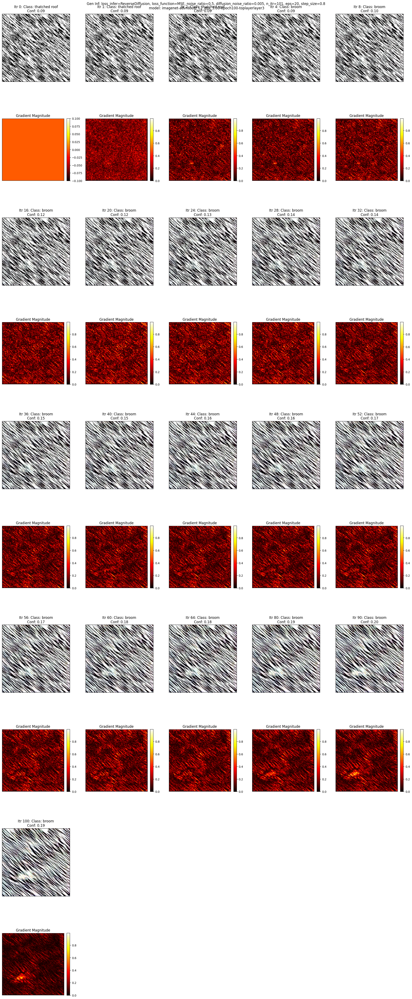

file already exists, adding instance number
saved at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/imagenet-advrobust_L2_eps_3.00-100/FigureGroundUniform_layer3_geninf_imagenet_advrobust_L2_eps_3.00_epoch100_ReverseDiffusion_MSE_noise_ratio0.5_diffusion_noise_ratio0.005_n_itr101_eps20_step_size0.8_confitr0_False_with_gradients_instance0.pdf


In [404]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch

# show the images and gradients in a grid - now with 2 rows per pattern
n_cols = 5
n_pattern_rows = len(selected_inferred_patterns)//n_cols + (1 if len(selected_inferred_patterns)%n_cols > 0 else 0)
if n_pattern_rows == 0:
    n_pattern_rows = 1
# Double the rows to accommodate gradients below each image
n_total_rows = n_pattern_rows * 2
fig, axes = plt.subplots(n_total_rows, n_cols, figsize=[20, 5*n_pattern_rows * 2])

if model_config['dataset_model'] == 'vggface2':
    norm_mean = torch.tensor([0.5,0.5,0.5]).view(-1, 1, 1).cuda()
    norm_std = torch.tensor([0.5,0.5,0.5]).view(-1, 1, 1).cuda()
elif model_config['dataset_model'] == 'imagenet' or model_config['dataset_model'] == 'imagenetvggface2':
    norm_mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1).cuda()
    norm_std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1).cuda()

for i in range(len(selected_inferred_patterns)):
    # Calculate positions for image and gradient
    row_idx = (i // n_cols) * 2  # Multiply by 2 to skip rows for gradients
    col_idx = i % n_cols
    
    # Get axes for both image and gradient
    if n_pattern_rows == 1:
        ax_img = axes[0] if n_cols == 1 else axes[col_idx]
        ax_grad = axes[1] if n_cols == 1 else axes[n_cols + col_idx]
    else:
        ax_img = axes[row_idx, col_idx]
        ax_grad = axes[row_idx + 1, col_idx]
        
    # Get the image and corresponding gradients
    image_to_compute = selected_inferred_patterns[i].squeeze(0).detach().cpu().numpy().transpose(1,2,0)
    gradients = selected_grad_patterns[i].squeeze(0).detach().cpu().numpy().transpose(1,2,0)
    
    # Normalize gradients for visualization
    grad_magnitude = np.sqrt(np.sum(gradients**2, axis=2))
    grad_normalized = (grad_magnitude - grad_magnitude.min()) / (grad_magnitude.max() - grad_magnitude.min() + 1e-8)
        
    
    predicted_emotion = 'N/A'
    confidence_emotion = 0
    first_itr_conf_got_high = 0
    emotion_detected = False
    color_title = 'black'
    
    # Plot image in top subplot
    ax_img.imshow(image_to_compute)
    # Plot gradient heatmap in bottom subplot
    gradient_plot = ax_grad.imshow(grad_normalized, cmap='hot')
    plt.colorbar(gradient_plot, ax=ax_grad, fraction=0.046, pad=0.04)
    
    # Set titles
    if model_config['dataset_model'] == 'imagenet':
        ax_img.set_title(f'Itr {iteration_numbers[i]}: Class: {labels_imagenet[perceived_categories[i]]}\nConf: {confidence_list[i]:.2f}', color=color_title)
    else:
        ax_img.set_title(f'Itr {iteration_numbers[i]}: Class: {perceived_categories[i]}\nConf: {confidence_list[i]:.2f}', color=color_title)
    
    ax_grad.set_title('Gradient Magnitude')
    
    # Remove ticks from both subplots
    ax_img.set_xticks([])
    ax_img.set_yticks([])
    ax_grad.set_xticks([])
    ax_grad.set_yticks([])

fig.suptitle(f'Gen Inf: loss_infer={inference_config["loss_infer"]}, loss_function={inference_config["loss_function"]}, noise_ratio={inference_config["initial_inference_noise_ratio"]}, diffusion_noise_ratio={inference_config["diffusion_noise_ratio"]}, n_itr={inference_config["n_itr"]}, eps={inference_config["eps"]}, step_size={inference_config["step_size"]}\n model: {args.dataset_model}-{args.model_training}-epoch{args.epoch_chkpnt}-toplayer{inference_config["top_layer"]}')

# Remove empty axes
for i in range(n_total_rows):
    for j in range(n_cols):
        pattern_idx = (i//2) * n_cols + j
        if pattern_idx >= len(selected_inferred_patterns):
            if n_pattern_rows > 1:
                fig.delaxes(axes[i, j])

plt.tight_layout()
plt.show()

# Save figure
figsave_dir = os.path.join(resultsdir, f'{args.dataset_model}-{args.model_training}-{args.epoch_chkpnt}/')
if not os.path.exists(figsave_dir):
    os.makedirs(figsave_dir)

fig_name = f'{image_name}_{inference_config["top_layer"]}_geninf_{model_config["dataset_model"]}_{model_config["model_training"]}_epoch{model_config["epoch_chkpnt"]}_{inference_config["loss_infer"]}_{inference_config["loss_function"]}_noise_ratio{inference_config["initial_inference_noise_ratio"]}_diffusion_noise_ratio{inference_config["diffusion_noise_ratio"]}_n_itr{inference_config["n_itr"]}_eps{inference_config["eps"]}_step_size{inference_config["step_size"]}'
fig_name = fig_name + f'_confitr{first_itr_conf_got_high}_{emotion_detected}_with_gradients'

instance_counter = 0
while os.path.exists(os.path.join(figsave_dir, fig_name+'.pdf')):
    print('file already exists, adding instance number')
    if 'instance' in fig_name:
        fig_name = fig_name.split('_instance')[0]
    fig_name = fig_name + f'_instance{instance_counter}'
    instance_counter += 1

fig.savefig(os.path.join(figsave_dir, fig_name+'.pdf'), dpi=300, bbox_inches='tight')
print('saved at:', os.path.join(figsave_dir, fig_name+'.pdf'))

# Save results dictionary
dict_results = {
    'model_config': model_config,
    'inference_config': inference_config,
    'selected_inferred_patterns': selected_inferred_patterns,
    'selected_grad_patterns': selected_grad_patterns,
    'perceived_categories': perceived_categories,
    'iteration_numbers': iteration_numbers,

}
np.save(os.path.join(figsave_dir, fig_name+'.npy'), dict_results)

In [45]:
# # save the last pattern to Stimuli folder
# last_pattern = selected_inferred_patterns[-1][0, 0].detach().cpu().numpy()
# plt.imsave(os.path.join(path_codes, 'Stimuli/FigureGroundLamme_last_pattern.png'), last_pattern)
# # read the last pattern
# last_pattern = plt.imread(os.path.join(path_codes, 'Stimuli/FigureGroundLamme_last_pattern.png'))
# plt.imshow(last_pattern)
# plt.show()


## Compare the Figure vs Uniform

In [405]:
image_name1 = 'FigureGroundLamme' #'FigureGroundUniform' #'FigureGroundTexture' #'FigureGroundLamme'# 'FigureGroundLammeBordersDetected' #'FigureGroundLamme'
image1, cmap = ImageLoader(args.dataset_model).load_image(image_name1)


image_name2 = 'FigureGroundUniform' #'FigureGroundUniform' #'FigureGroundTexture' #'FigureGroundLamme'# 'FigureGroundLammeBordersDetected' #'FigureGroundLamme'
image2, cmap = ImageLoader(args.dataset_model).load_image(image_name2)

selected_inferred_patterns1, perceived_categories1, confidence_list1, misc_info_dict1 = generative_inference(model_config, image1, inference_config)
if inference_config['misc_info']['keep_grads']:
    selected_grad_patterns1 = misc_info_dict1['grad_info']
else:
    selected_grad_patterns1 = []

selected_inferred_patterns2, perceived_categories2, confidence_list2, misc_info_dict2 = generative_inference(model_config, image2, inference_config)
if inference_config['misc_info']['keep_grads']:
    selected_grad_patterns2 = misc_info_dict2['grad_info']
else:
    selected_grad_patterns2 = []



iteration_numbers = inference_config['iterations_to_show']
fig_name = f'{image_name1}_{image_name2}_{inference_config["top_layer"]}_geninf_{model_config["dataset_model"]}_{model_config["model_training"]}_epoch{model_config["epoch_chkpnt"]}_{inference_config["loss_infer"]}_{inference_config["loss_function"]}_noise_ratio{inference_config["initial_inference_noise_ratio"]}_diffusion_noise_ratio{inference_config["diffusion_noise_ratio"]}_n_itr{inference_config["n_itr"]}_eps{inference_config["eps"]}_step_size{inference_config["step_size"]}'


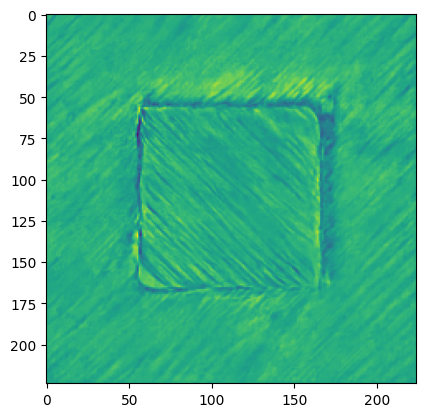

In [406]:
plt.imshow(selected_grad_patterns1[-1][0, 0].detach().cpu().numpy())
plt.show()

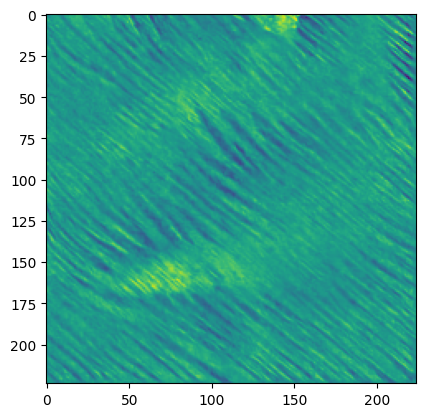

In [407]:
plt.imshow(selected_grad_patterns2[-1][0, 0].detach().cpu().numpy())
plt.show()

## Bar plot for the Receptive fields on the edges


/tmp/ipykernel_536847/3068944804.py:121: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


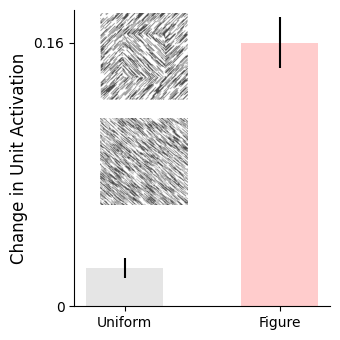

saved at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/imagenet-advrobust_L2_eps_3.00-100/Receptive_field_bar_onedge_rightFigureGroundLamme_FigureGroundUniform_layer3_geninf_imagenet_advrobust_L2_eps_3.00_epoch100_ReverseDiffusion_MSE_noise_ratio0.5_diffusion_noise_ratio0.005_n_itr101_eps20_step_size0.8.pdf


In [450]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image

edge = 'right'
baseline_pattern1 = selected_inferred_patterns1[0]
baseline_pattern2 = selected_inferred_patterns2[0]

# baseline_pattern1 = torch.ones_like(selected_inferred_patterns1[0])
# baseline_pattern2 = torch.ones_like(selected_inferred_patterns2[0])

def get_rect_points(x_start, x_end, y_start, y_end, spacing=2):
    """Generate points along a rectangle edge."""
    points = []
    for x in range(x_start, x_end + 1, spacing):
        for y in range(y_start, y_end + 1, spacing):
            points.append((y, x))
    return points

# Example sizes
image_size = 224
# Define edge coordinates

startx = image_size // 4   # 56
starty = 3*image_size // 4-5   # 56
sizex = image_size // 2
sizey = 10

def get_activations(patterns, patten_baseline, startx, starty, sizex, sizey):
    area_acts = []
    area_sems = []
    for pattern in patterns:
        # Get points along the rectangle
        selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
        pattern = patten_baseline - pattern  # also accounting for zero showing black
        # Calculate activations for all points
        point_activations = []
        for y, x in selected_points:
            if 0 <= x < image_size and 0 <= y < image_size:
                activation = (pattern[0, :, x, y]).mean().item()
                point_activations.append(activation)
        
        avg_activation = torch.tensor(point_activations).mean()
        sem_activation = torch.tensor(point_activations).std() / torch.sqrt(torch.tensor(len(point_activations)))
        area_acts.append(avg_activation)
        area_sems.append(sem_activation)
        
    return torch.stack(area_acts), torch.stack(area_sems)


figure_acts, figure_sems = get_activations(selected_inferred_patterns1, baseline_pattern1, startx, starty, sizex, sizey)
uniform_acts, uniform_sems = get_activations(selected_inferred_patterns2, baseline_pattern2, startx, starty, sizex, sizey)

# Convert to numpy
figure_mean = figure_acts.cpu().numpy()
uniform_mean = uniform_acts.cpu().numpy()
figure_sem = figure_sems.cpu().numpy()
uniform_sem = uniform_sems.cpu().numpy()

# # Create the main plot
fig, ax = plt.subplots(figsize=(3.5, 3.5))  # Adjust figure size


ax.bar([0, 0.5], [uniform_mean[-1], figure_mean[-1]], color=['gray', 'red'], alpha=0.2, width=0.25)
ax.errorbar([0, 0.5], [uniform_mean[-1], figure_mean[-1]], [uniform_sem[-1], figure_sem[-1]], fmt='none', color='black')

ax.set_xticks([0, 0.5])
ax.set_xticklabels(['Uniform', 'Figure'])

ax.set_ylim([0, 0.18])
ax.set_yticks([0, 0.16])
ax.set_yticklabels([0, 0.16])

# ax.bar([0, 0.25], [uniform_mean[0], uniform_mean[-1]], color=['gray', 'gray'], alpha=0.2, width=0.25)
# ax.bar([1, 1.25], [figure_mean[0], figure_mean[-1]], color=['red', 'red'], alpha=0.2, width=0.25)
# ax.errorbar([0, 0.25], [uniform_mean[0], uniform_mean[-1]], [uniform_sem[0], uniform_sem[-1]], fmt='none', color='gray')
# ax.errorbar([1, 1.25], [figure_mean[0], figure_mean[-1]], [figure_sem[0], figure_sem[-1]], fmt='none', color='red')
# Customize axes and labels
# ax.set_xlabel('Iteration', fontsize=12)
ax.set_ylabel('Change in Unit Activation', fontsize=12)
ax.tick_params(axis='both', labelsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# ax.set_ylim([0, 0.04])
# ax.set_yticks([0, 0.04])
# ax.set_yticklabels([0, 0.04])

# ax.set_xlim([0, iteration_numbers[-1]])

# Add legend
# ax.legend(fontsize=10, loc='upper left', frameon=False)

# Remove grid for cleaner look
ax.grid(False)

# Create inset with sampling points
inset_ax_figure = fig.add_axes([0.3, 0.7, 0.25, 0.25])
inset_ax_uniform = fig.add_axes([0.3, 0.4, 0.25, 0.25])
# Resize image using PIL
image1 = image1.resize((224, 224))

inset_ax_figure.imshow(image1, cmap='gray', alpha=0.7)  # Add transparency to the image

image2 = image2.resize((224, 224))
inset_ax_uniform.imshow(image2, cmap='gray', alpha=0.7)  # Add transparency to the image

# Plot sampling points on inset
selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
x_points = [x for y, x in selected_points]
y_points = [y for y, x in selected_points]

# Plot with corrected coordinates
# inset_ax_figure.plot(y_points, x_points, 'o', color='red', markersize=0.5, alpha=0.1)
# inset_ax_uniform.plot(y_points, x_points, 'o', color='gray', markersize=0.5, alpha=0.1)

# Customize inset appearance
inset_ax_figure.axis('off')  # Hide axis for cleaner visualization
inset_ax_uniform.axis('off')  # Hide axis for cleaner visualization
plt.tight_layout()
plt.show()

# Save the figure
fig_name_receptivefield = f'Receptive_field_bar_onedge_{edge}' + fig_name

fig.savefig(os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'), dpi=300, bbox_inches='tight')
print('saved at:', os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'))

## The Receptive filed on one edge

/tmp/ipykernel_536847/2314383584.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


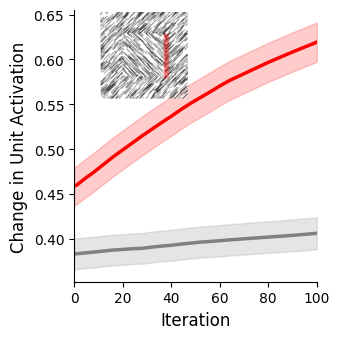

In [423]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image

edge = 'right'
# baseline_pattern1 = selected_inferred_patterns1[0]
# baseline_pattern2 = selected_inferred_patterns2[0]

baseline_pattern1 = torch.ones_like(selected_inferred_patterns1[0])
baseline_pattern2 = torch.ones_like(selected_inferred_patterns2[0])

def get_rect_points(x_start, x_end, y_start, y_end, spacing=2):
    """Generate points along a rectangle edge."""
    points = []
    for x in range(x_start, x_end + 1, spacing):
        for y in range(y_start, y_end + 1, spacing):
            points.append((y, x))
    return points

# Example sizes
image_size = 224
# Define edge coordinates

startx = image_size // 4   # 56
starty = 3*image_size // 4-5   # 56
sizex = image_size // 2
sizey = 10

def get_activations(patterns, patten_baseline, startx, starty, sizex, sizey):
    area_acts = []
    area_sems = []
    for pattern in patterns:
        # Get points along the rectangle
        selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
        pattern = patten_baseline - pattern  # also accounting for zero showing black
        # Calculate activations for all points
        point_activations = []
        for y, x in selected_points:
            if 0 <= x < image_size and 0 <= y < image_size:
                activation = (pattern[0, :, x, y]).mean().item()
                point_activations.append(activation)
        
        avg_activation = torch.tensor(point_activations).mean()
        sem_activation = torch.tensor(point_activations).std() / torch.sqrt(torch.tensor(len(point_activations)))
        area_acts.append(avg_activation)
        area_sems.append(sem_activation)
        
    return torch.stack(area_acts), torch.stack(area_sems)


figure_acts, figure_sems = get_activations(selected_inferred_patterns1, baseline_pattern1, startx, starty, sizex, sizey)
uniform_acts, uniform_sems = get_activations(selected_inferred_patterns2, baseline_pattern2, startx, starty, sizex, sizey)

# Convert to numpy
figure_mean = figure_acts.cpu().numpy()
uniform_mean = uniform_acts.cpu().numpy()
figure_sem = figure_sems.cpu().numpy()
uniform_sem = uniform_sems.cpu().numpy()

# Create the main plot
fig, ax = plt.subplots(figsize=(3.5, 3.5))  # Adjust figure size

# Plot activation curves
ax.plot(iteration_numbers, figure_mean, 'red', linewidth=2.5, label='Figure')
ax.plot(iteration_numbers, uniform_mean, 'gray', linewidth=2.5, label='Uniform')

# Add shaded error bars
ax.fill_between(iteration_numbers, figure_mean - figure_sem, figure_mean + figure_sem, color='red', alpha=0.2)
ax.fill_between(iteration_numbers, uniform_mean - uniform_sem, uniform_mean + uniform_sem, color='gray', alpha=0.2)

# Customize axes and labels
ax.set_xlabel('Iteration', fontsize=12)
ax.set_ylabel('Change in Unit Activation', fontsize=12)
ax.tick_params(axis='both', labelsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# ax.set_ylim([0, 0.04])
# ax.set_yticks([0, 0.04])
# ax.set_yticklabels([0, 0.04])

ax.set_xlim([0, iteration_numbers[-1]])

# Add legend
# ax.legend(fontsize=10, loc='upper left', frameon=False)

# Remove grid for cleaner look
ax.grid(False)

# Create inset with sampling points
inset_ax = fig.add_axes([0.3, 0.7, 0.25, 0.25])
# Resize image using PIL
image1 = image1.resize((224, 224))

inset_ax.imshow(image1, cmap='gray', alpha=0.7)  # Add transparency to the image

# Plot sampling points on inset
selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
x_points = [x for y, x in selected_points]
y_points = [y for y, x in selected_points]

# Plot with corrected coordinates
inset_ax.plot(y_points, x_points, 'o', color='red', markersize=0.5, alpha=0.1)

# Customize inset appearance
inset_ax.axis('off')  # Hide axis for cleaner visualization
plt.tight_layout()
plt.show()

# Save the figure
fig_name_receptivefield = f'Receptive_field_onedge_{edge}' + fig_name

# fig.savefig(os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'), dpi=300, bbox_inches='tight')
# print('saved at:', os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'))

## The change over all the square

/tmp/ipykernel_536847/268810719.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


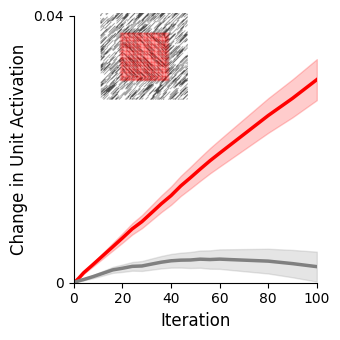

saved at: /home/tahereh/engram/users/Tahereh/Research/Results/Generative_Inference/imagenet-advrobust_L2_eps_3.00-100/Receptive_field_FigureGroundLamme_FigureGroundUniform_layer3_geninf_imagenet_advrobust_L2_eps_3.00_epoch100_ReverseDiffusion_MSE_noise_ratio0.5_diffusion_noise_ratio0.005_n_itr101_eps20_step_size0.8.pdf


In [410]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image

def get_rect_points(x_start, x_end, y_start, y_end, spacing=2):
    """Generate points along a rectangle edge."""
    points = []
    for x in range(x_start, x_end + 1, spacing):
        for y in range(y_start, y_end + 1, spacing):
            points.append((y, x))
    return points

# Example sizes
image_size = 224
# Define square coordinates
startx = image_size // 4 - 5  # 56
starty = image_size // 4 - 5  # 56
sizex = image_size // 2 + 10  # 112
sizey = image_size // 2 + 10  # 112

def get_activations(patterns, patten_baseline, startx, starty, sizex, sizey):
    area_acts = []
    area_sems = []
    for pattern in patterns:
        # Get points along the rectangle
        selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
        pattern = patten_baseline - pattern  # also accounting for zero showing black
        # Calculate activations for all points
        point_activations = []
        for y, x in selected_points:
            if 0 <= x < image_size and 0 <= y < image_size:
                activation = (pattern[0, :, x, y]).mean().item()
                point_activations.append(activation)
        
        avg_activation = torch.tensor(point_activations).mean()
        sem_activation = torch.tensor(point_activations).std() / torch.sqrt(torch.tensor(len(point_activations)))
        area_acts.append(avg_activation)
        area_sems.append(sem_activation)
        
    return torch.stack(area_acts), torch.stack(area_sems)


figure_acts, figure_sems = get_activations(selected_inferred_patterns1, selected_inferred_patterns1[0], startx, starty, sizex, sizey)
uniform_acts, uniform_sems = get_activations(selected_inferred_patterns2, selected_inferred_patterns2[0], startx, starty, sizex, sizey)

# Convert to numpy
figure_mean = figure_acts.cpu().numpy()
uniform_mean = uniform_acts.cpu().numpy()
figure_sem = figure_sems.cpu().numpy()
uniform_sem = uniform_sems.cpu().numpy()

# Create the main plot
fig, ax = plt.subplots(figsize=(3.5, 3.5))  # Adjust figure size

# Plot activation curves
ax.plot(iteration_numbers, figure_mean, 'red', linewidth=2.5, label='Figure')
ax.plot(iteration_numbers, uniform_mean, 'gray', linewidth=2.5, label='Uniform')

# Add shaded error bars
ax.fill_between(iteration_numbers, figure_mean - figure_sem, figure_mean + figure_sem, color='red', alpha=0.2)
ax.fill_between(iteration_numbers, uniform_mean - uniform_sem, uniform_mean + uniform_sem, color='gray', alpha=0.2)

# Customize axes and labels
ax.set_xlabel('Iteration', fontsize=12)
ax.set_ylabel('Change in Unit Activation', fontsize=12)
ax.tick_params(axis='both', labelsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_ylim([0, 0.04])
ax.set_yticks([0, 0.04])
ax.set_yticklabels([0, 0.04])

ax.set_xlim([0, iteration_numbers[-1]])

# Add legend
# ax.legend(fontsize=10, loc='upper left', frameon=False)

# Remove grid for cleaner look
ax.grid(False)

# Create inset with sampling points
inset_ax = fig.add_axes([0.3, 0.7, 0.25, 0.25])
# Resize image using PIL
image1 = image1.resize((224, 224))

inset_ax.imshow(image1, cmap='gray', alpha=0.7)  # Add transparency to the image

# Plot sampling points on inset
selected_points = get_rect_points(startx, startx + sizex, starty, starty + sizey)
x_points = [x for y, x in selected_points]
y_points = [y for y, x in selected_points]

# Plot with corrected coordinates
inset_ax.plot(y_points, x_points, 'o', color='red', markersize=0.5, alpha=0.1)

# Customize inset appearance
inset_ax.axis('off')  # Hide axis for cleaner visualization
plt.tight_layout()
plt.show()

# Save the figure
fig_name_receptivefield = f'Receptive_field_' + fig_name

fig.savefig(os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'), dpi=300, bbox_inches='tight')
print('saved at:', os.path.join(figsave_dir, fig_name_receptivefield + '.pdf'))